In [1]:
# import basic libraries
import pandas as pd
import numpy as np
import glob
import os

# import plotting
import matplotlib.patches as patches
import matplotlib.pyplot as plt
%matplotlib inline

# import image manipulation
from skimage.transform import resize
from skimage import img_as_bool

#Tensorflow
import tensorflow as tf

C:\Users\ggswo\anaconda3\envs\Streamlit\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
#Parameters
img_height= 352
img_width= 512
batch_size= 16
#TRAIN_PATH = '/content/drive/MyDrive/cloud_segmentation/train_images/'
TRAIN_PATH ='train_images/'
# selection of number of pictures used for training, validation, testing, overall there are 5546 pictures in the training folder
train, valid, test = 4945, 300 , 300
BATCH_SIZE = 16
BUFFER_SIZE = 1024
NUM_EPOCHS = 15
VAL_SUBSPLITS = 1

**Helper functions Preprocessing**

In [12]:
# Functions for preprocessing

def augment(input_image, input_mask):
    if tf.random.uniform(()) > 0.5:
       # Random flipping of the image and mask
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)
    #if tf.random.uniform(()) > 0.5:
    #    input_image = tf.image.flip_up_down(input_image)
     #   input_mask = tf.image.flip_up_down(input_mask)       

    return input_image, input_mask

def normalize(input_image):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image

def load_image_train(input_image, input_mask):
    input_image, input_mask = augment(input_image, input_mask)
    input_image = normalize(input_image)

    return input_image, input_mask

def load_image_test(input_image, input_mask):
   #input_image, input_mask = resize(input_image, input_mask)
    input_image= normalize(input_image)
    return input_image, input_mask

Helper functions for visualisation

In [3]:
# Visualisation of images and masks

def show(display_list):
    plt.figure(figsize=(10, 10))
    title = ["Input Image", "True Mask", "Predicted Mask"]
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis("off")
    plt.show();

**Helper functions for generating the masks**

In [4]:
def rle_to_mask(rle):
  ''' Turns a rle-label into a single numpy mask '''
  #split rle-string into list, change type to int, turn list into np-array, reshape into two columns containing the inexes and length of the individual labels
  if rle==0:
    mask=np.zeros((1400,2100))
  else:
    rle=rle.split(' ')
    rle=[int(string) for string in rle]
    rle=np.array(rle)
    rle=rle.reshape(-1,2)

    # Create empty mask and reshape into one dimension
    mask=np.zeros((1400,2100,1))
    mask=mask.reshape(-1)

    # iterate over the individual labels and color the labeled pixels white
    for line in rle:
      start=line[0]-1
      end=line[0]+line[1]
      mask[start:end]=1

    # turn the one-dim array back into original shape (first column wise, because the labels are coumnwise )
    mask=mask.reshape(2100,1400)
    mask=mask.T

  return mask

**Data generators to fetch masks and images and creation of tf.datasets**

In [5]:
def combine_masks_gen(path: str):
  ''' Ceates a numpy mask for every 'jpg' picture in the trainingfolder(path) based on the labels in the train.csv. One mask contains multiple layers for the different categorys.
  '''
  height=352
  width = 512

  labels=("Fish", "Sugar", "Gravel", "Flower")

  train=pd.read_csv('train.csv')
  train['im_id'] = train['Image_Label'].apply(lambda x: x.split('_')[0])

  # Erstellen einer Liste train_fns, die den vollständigen Pfad der einzelnen trainingsbilder enthält
  train_fns = sorted(glob.glob(tf.compat.as_str_any(path) + '*.jpg'))
  # extaktion der Bildnamen der Bilder im Ordner mit den train bildern
  img_names=[path.split('\\')[-1] for path in train_fns]  

  for image_name in img_names:
    masks = np.zeros((height, width, 4), dtype='bool')
    encoded_masks = train.loc[train['im_id'] == image_name, 'EncodedPixels']
    for idx, label in enumerate(encoded_masks.values):
      if label is not np.nan:
        mask = rle_to_mask(label)
        # resize mask
        mask = img_as_bool(resize(mask, (height, width), order=0))
        masks[:, :, idx] = mask
    yield masks

In [6]:
# Create dataset containing the masks using the generator
spec = tf.TensorSpec(shape=(352, 512, 4), dtype=tf.float64)
ds_masks = tf.data.Dataset.from_generator(combine_masks_gen, args=[TRAIN_PATH], output_signature = spec )

In [7]:
# Create dataset containing the training pictures using "image_dataset_from_directory"
ds_images = tf.keras.utils.image_dataset_from_directory(
  TRAIN_PATH,
  labels=None,
  shuffle=False,
  image_size=(img_height, img_width),
  batch_size=None)

Found 5546 files belonging to 1 classes.


**Combine genereated Datasets**

In [8]:
# Combine image dataset and masks dataset into one dataset
ds = tf.data.Dataset.zip((ds_images, ds_masks))

**Split in train/valid/test**

In [9]:
#Split#
# the dataset into train/valid/test:
ds_train = ds.take(train)
ds_valid = ds.skip(train).take(valid)
ds_test = ds.skip(train+valid).take(test)

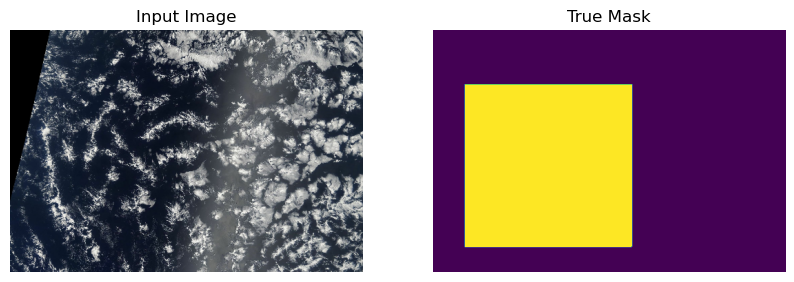

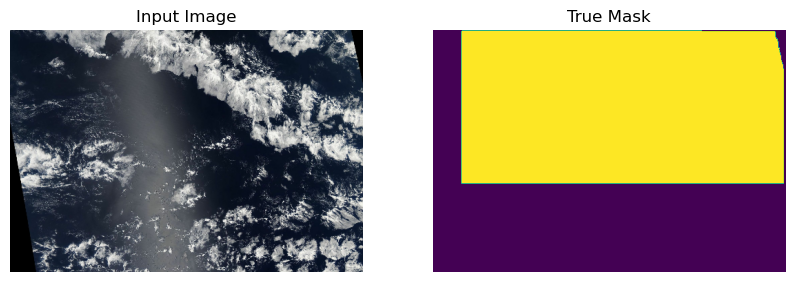

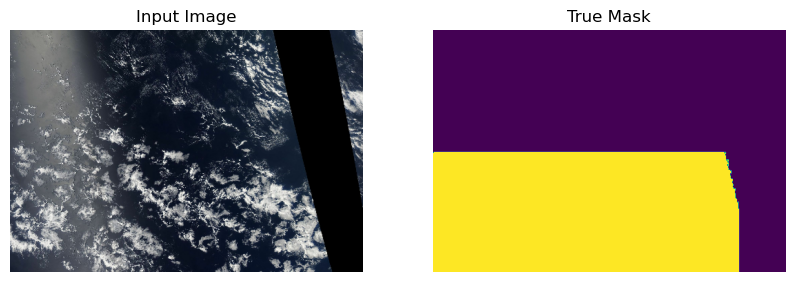

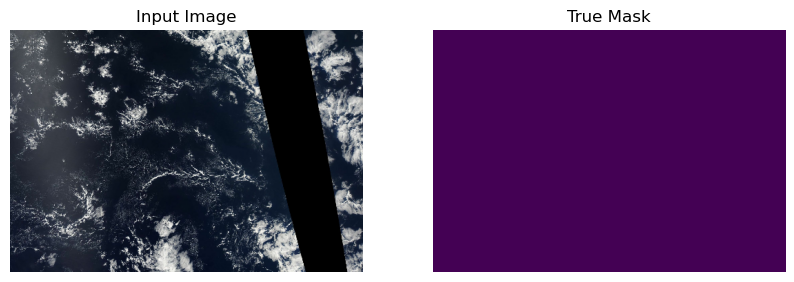

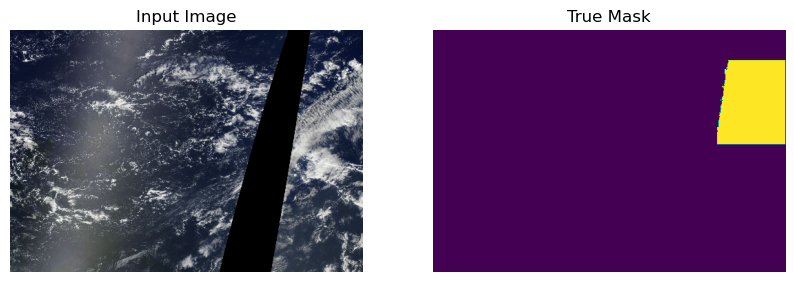

...

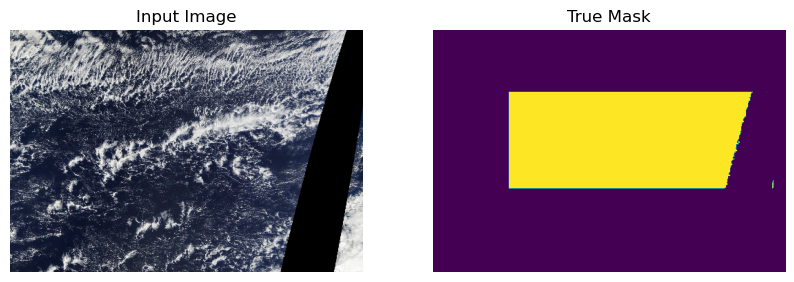

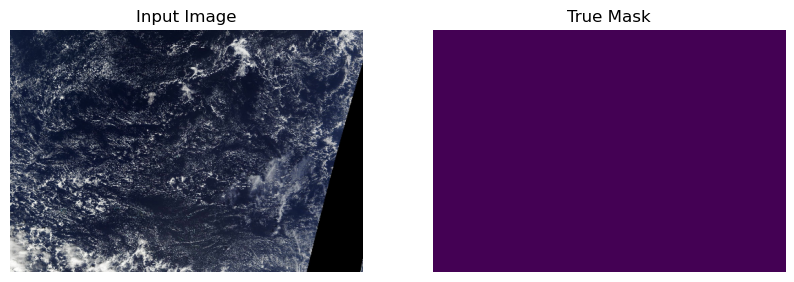

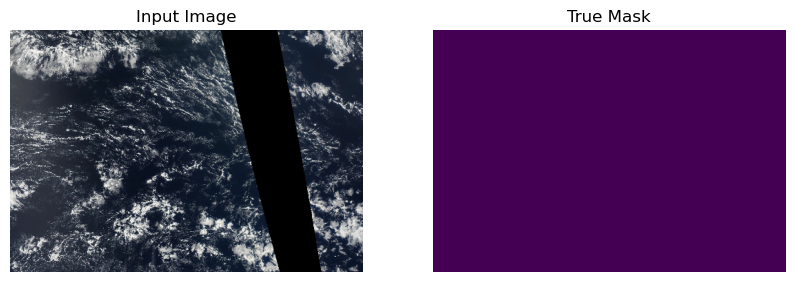

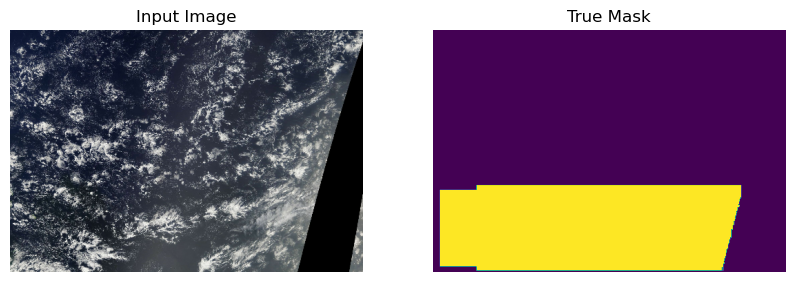

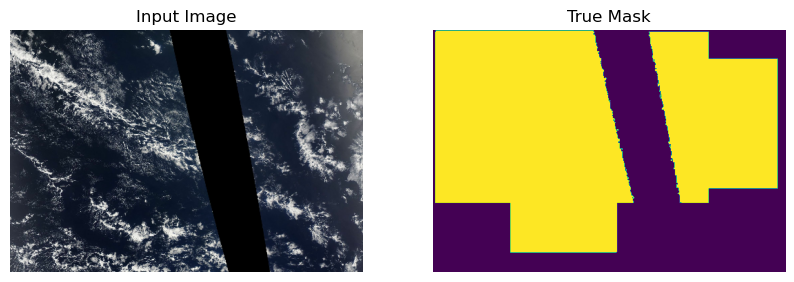

In [10]:
# Visualisation prior to augmentation
for image, mask in ds_train.take(20):
    mask = np.expand_dims(mask[:,:,0], axis=2)
    show([image, mask])


In [13]:
# Application of the preprocessing

ds_train = ds_train.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
ds_valid = ds_valid.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)

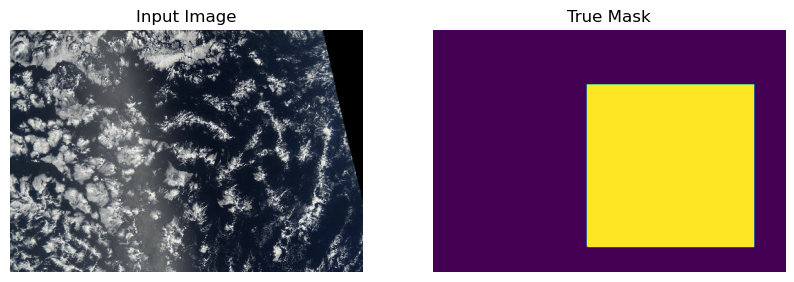

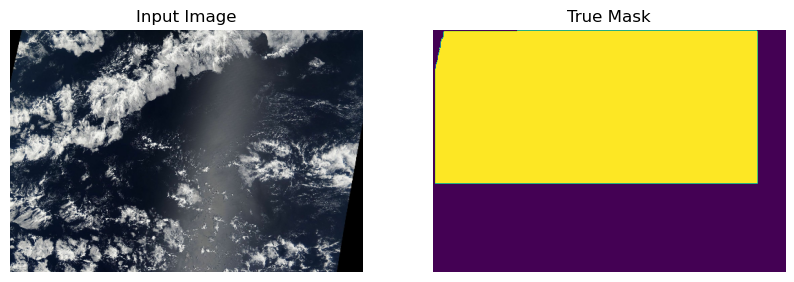

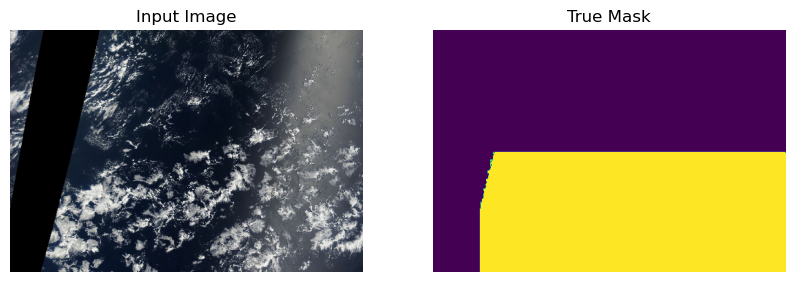

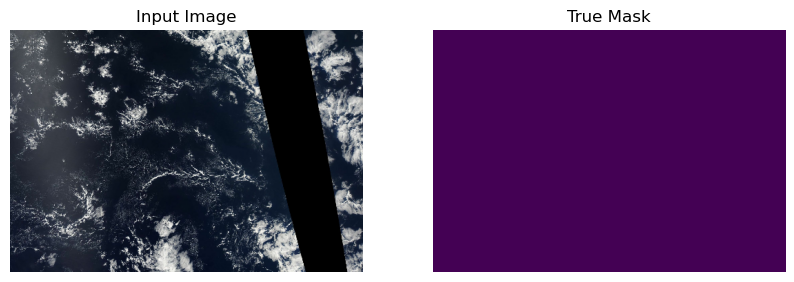

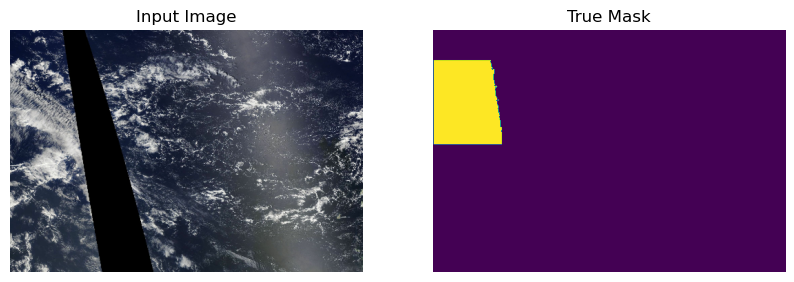

...

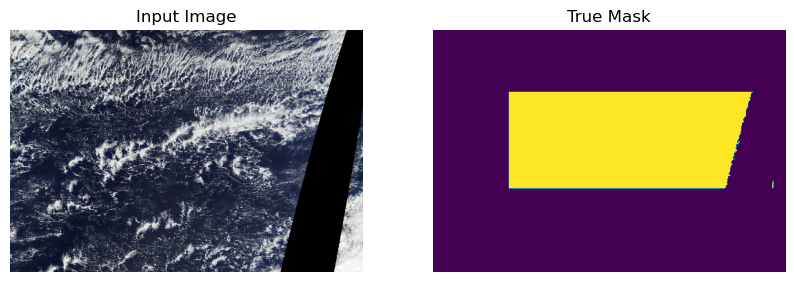

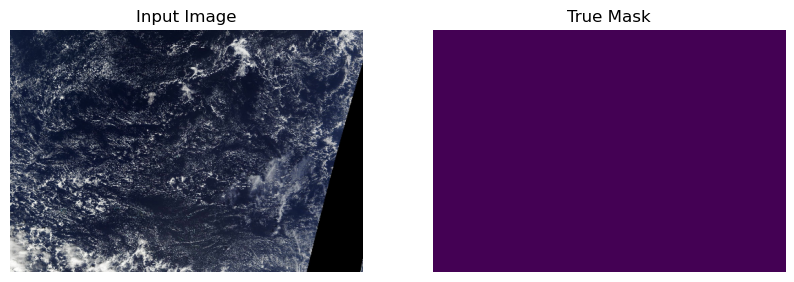

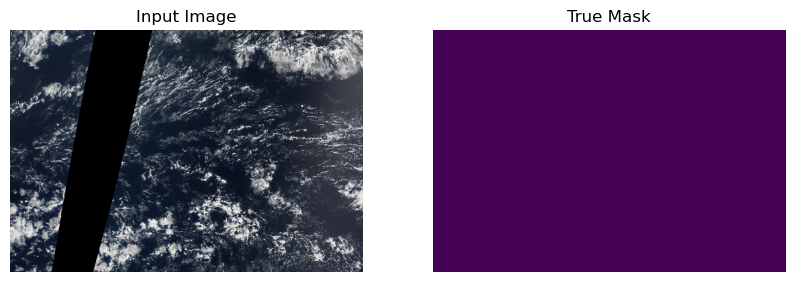

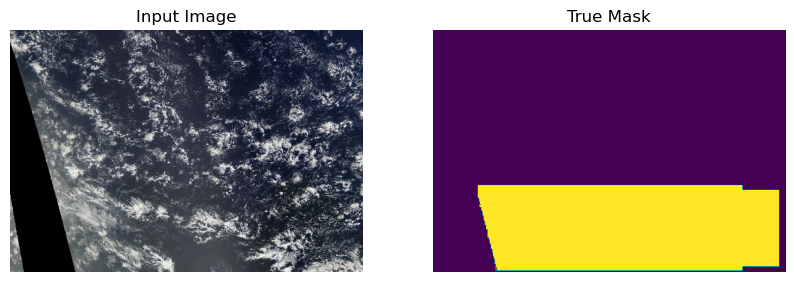

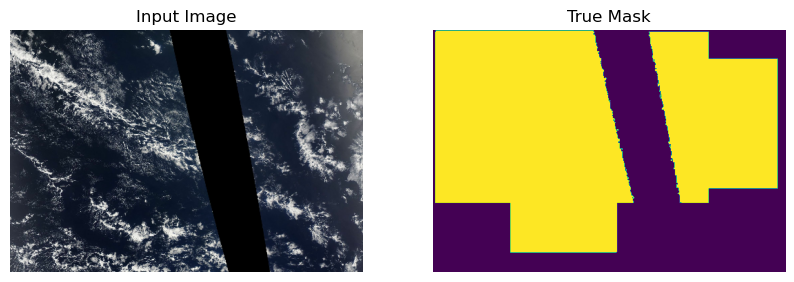

In [187]:
#Visualisation after augmentation
for image, mask in ds_train.take(20):
    mask = np.expand_dims(mask[:,:,0], axis=2)
    show([image, mask])

**chache, shuffle, batch and prefetch**

In [14]:
#Split datasets into batches and use a buffer for loading the training data

batches_train = ds_train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
batches_train = batches_train.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
batches_valid= ds_valid.batch(BATCH_SIZE)
batches_test = ds_test.batch(BATCH_SIZE)

**Modeling**

In [15]:
# Unet

num_classes = 4

inputs = tf.keras.layers.Input((352, 512, 3))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)


u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)


u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

**Dice coefficient as loss-function and metric**

In [16]:
# Dice coefficient to be used as metric

def dice_coeff(y_true, y_pred):
    smooth = 1.
    # Flatten
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

In [17]:
# Diceloss

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

**Model Compilation and fitting**

In [18]:
#model compilation

# changed learningrate from 0.001 to 0.005
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer=optimizer, loss=dice_loss, metrics=['accuracy',[dice_coeff]])

#tf.keras.utils.plot_model(model, "model.png")

In [ ]:
model.summary()


In [19]:
#callbacks

# Include the epoch in the file name (uses `str.format`)
checkpoint_path = "Checkpoints/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights every 2 epochs
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path, 
    verbose=1, 
    save_weights_only=True,
    save_freq=20*BATCH_SIZE)

reduce_learning_rate = tf.keras.callbacks.ReduceLROnPlateau(
                                    monitor="val_loss",
                                    factor=0.3,
                                    patience=2, #wird aktiv, wenn die Verbesserung von val_loss für 2 epochen stagniert                                                                      
                                    cooldown = 3, # number of epochs to wait before resuming normal operation after  lr has been reduced.
                                    verbose=1)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs'),
        reduce_learning_rate,
        cp_callback]

In [40]:
# model fit variante aus "Unet segmentation in keras"

STEPS_PER_EPOCH = train // BATCH_SIZE
VALIDATION_STEPS = valid // BATCH_SIZE // VAL_SUBSPLITS
model_history = model.fit(batches_train,
                              epochs=NUM_EPOCHS,
                              steps_per_epoch=STEPS_PER_EPOCH,
                              validation_steps=VALIDATION_STEPS,
                              validation_data=batches_valid,
                              callbacks=callbacks)

Epoch 1/15
309/309 [==============================] - 2603s 8s/step - loss: 0.4504 - accuracy: 0.3926 - dice_coeff: 0.5496 - val_loss: 0.4679 - val_accuracy: 0.3417 - val_dice_coeff: 0.5321 - lr: 2.7000e-04
Epoch 2/15
 10/309 [..............................] - ETA: 19:16 - loss: 0.4435 - accuracy: 0.4027 - dice_coeff: 0.5292
Epoch 2: saving model to Checkpoints\cp-0002.ckpt
309/309 [==============================] - 1955s 6s/step - loss: 0.4499 - accuracy: 0.3923 - dice_coeff: 0.5492 - val_loss: 0.4670 - val_accuracy: 0.3545 - val_dice_coeff: 0.5330 - lr: 2.7000e-04
Epoch 3/15
 21/309 [=>............................] - ETA: 17:16 - loss: 0.4405 - accuracy: 0.4010 - dice_coeff: 0.5540
Epoch 3: saving model to Checkpoints\cp-0003.ckpt
309/309 [==============================] - 1941s 6s/step - loss: 0.4484 - accuracy: 0.3940 - dice_coeff: 0.5513 - val_loss: 0.4682 - val_accuracy: 0.3564 - val_dice_coeff: 0.5318 - lr: 2.7000e-04
Epoch 4/15
 32/309 [==>...........................] - ETA: 17

In [44]:
model.save_weights('saved_model_3/')
#model.save('complete_saved_model_2/')

In [17]:
del model

NameError: name 'model' is not defined

In [17]:
# load weights from checkpoint
model.load_weights(checkpoint_dir)

PermissionError: [Errno 13] Unable to open file (unable to open file: name = 'Checkpoints', errno = 13, error message = 'Permission denied', flags = 0, o_flags = 0)

In [20]:
# load weights from most recent checkpoint
latest = tf.train.latest_checkpoint(checkpoint_dir)
model.load_weights(latest)

In [ ]:
# load model from checkpoint
model.load_weights('saved_model_2/')

In [ ]:
print(model.history.history.keys())

**Model evaluation**

In [21]:
# Model evaluation dice

dice = model.history.history['dice_coeff']
val_dice = model.history.history['val_dice_coeff']

plt.figure()
plt.plot( dice, 'r', label='Training dice')
plt.plot( val_dice, 'bo', label='Validation dice')
plt.title('Training and Validation Dice coefficient')
plt.xlabel('Epoch')
plt.ylabel('Dice coeffcient')
plt.ylim([0, 1])
plt.legend()
plt.show()

AttributeError: 'NoneType' object has no attribute 'history'

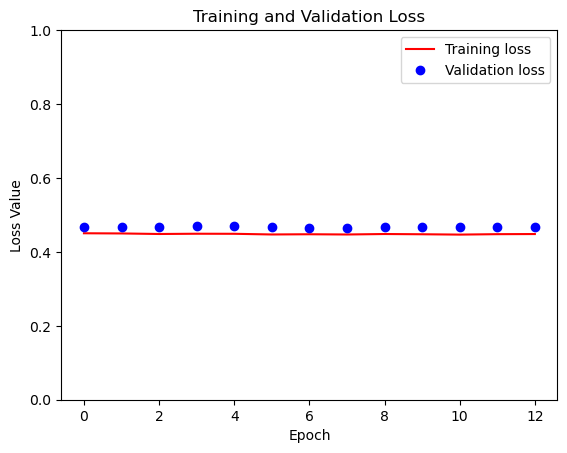

In [42]:
# Model evaluation loss

loss = model.history.history['loss']
val_loss = model.history.history['val_loss']

plt.figure()
plt.plot( loss, 'r', label='Training loss')
plt.plot( val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

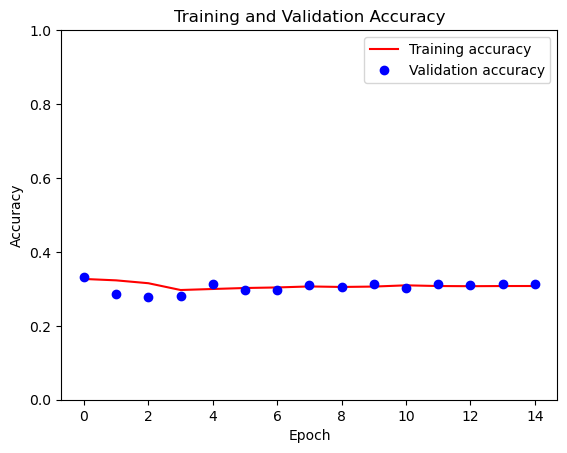

In [130]:
#evaluation accuracy
accuracy = model.history.history['accuracy']
val_acc = model.history.history['val_accuracy']

plt.figure()
plt.plot( accuracy, 'r', label='Training accuracy')
plt.plot( val_acc, 'bo', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend()
plt.show()

**Test**

**Making predictions**

In [21]:
def create_mask(pred_mask):
    pred_mask = (pred_mask>0.75)+0
    pred_mask = pred_mask[0,:,:,0]
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask

def show_predictions(dataset=None, num=5):
    for image, mask in dataset.take(num):
        mask = mask[0,:,:,0]
        mask = mask[..., tf.newaxis]
        #mask = np.expand_dims(mask[0,:,:,1], axis=2)
        pred_mask = create_mask(model.predict(image))        
        show([image[0], mask, pred_mask])


1/1 [==============================] - 2s 2s/step


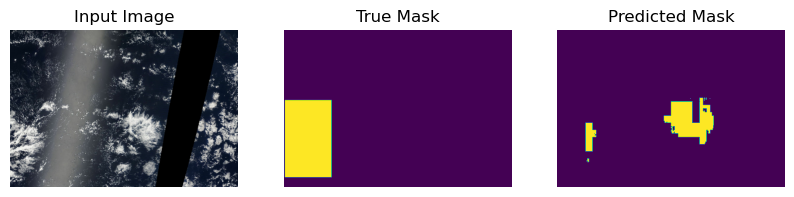

1/1 [==============================] - 1s 1s/step


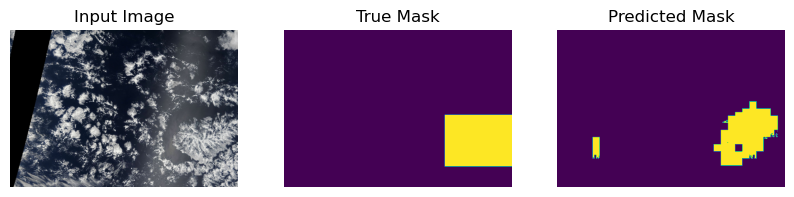

1/1 [==============================] - 1s 1s/step


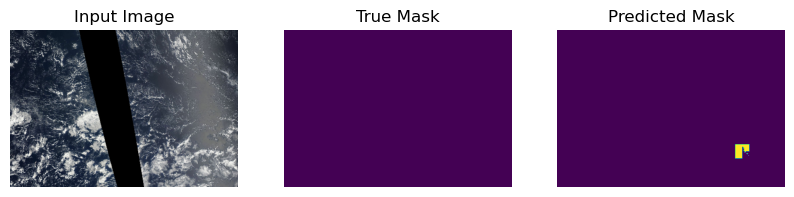

1/1 [==============================] - 1s 1s/step


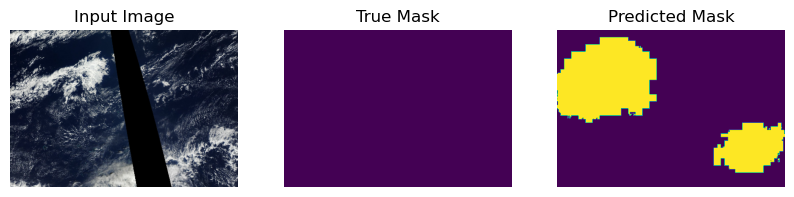

1/1 [==============================] - 1s 1s/step


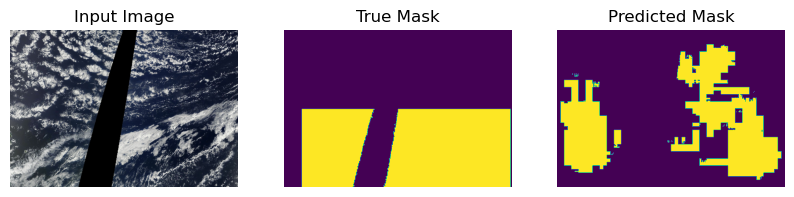

In [22]:
show_predictions(batches_train)

In [123]:
# modified function from "U-net segmentation in Keras"

sample_batch = next(iter(batches_train))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
show_predictions([sample_image, sample_mask])



AttributeError: 'list' object has no attribute 'take'